<a href="https://colab.research.google.com/github/RavivKerner/test/blob/working/Copy_of_Copy_of_02_production_with_tanks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()
from fastbook import *
from fastai.vision.widgets import *

     |████████████████████████████████| 720 kB 5.3 MB/s 
     |████████████████████████████████| 46 kB 3.9 MB/s 
     |████████████████████████████████| 189 kB 37.3 MB/s 
     |████████████████████████████████| 1.2 MB 39.6 MB/s 
     |████████████████████████████████| 56 kB 4.6 MB/s 
     |████████████████████████████████| 51 kB 315 kB/s 
Mounted at /content/gdrive


In [ ]:
path = Path('/content/gdrive/MyDrive/tanks')

# Tank classifier

## Download imges for training

In [2]:
#seting search vars
tank_types = 'merkava mk4','M1 Abrams','water'
path = Path('tanks')

In [3]:
#downloading 150 images to labeled directories
if not path.exists():
    path.mkdir()
    for o in tank_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        urls = search_images_ddg(f'{o} tank', max_images=150)
        download_images(dest, urls=urls)

In [4]:
#deleting not working files
fns = get_image_files(path)
failed = verify_images(fns)
failed.map(Path.unlink);


In [ ]:
fp = (path/'water').ls()[0]
[fp.parent.name]

['water']

In [ ]:
MultiCategoryBlock(add_na=True)

In [ ]:
def parentlabel(x):
  return [x.parent.name]

In [ ]:
altblock = DataBlock(blocks=(ImageBlock, MultiCategoryBlock(vocab =['M1 Abrams', 'merkava mk4', 'water'])),
                     get_items=get_image_files, 
                     splitter = RandomSplitter(),
                     get_y=parentlabel,
                     item_tfms = Resize(128))

In [ ]:
dls = altblock.dataloaders(path)

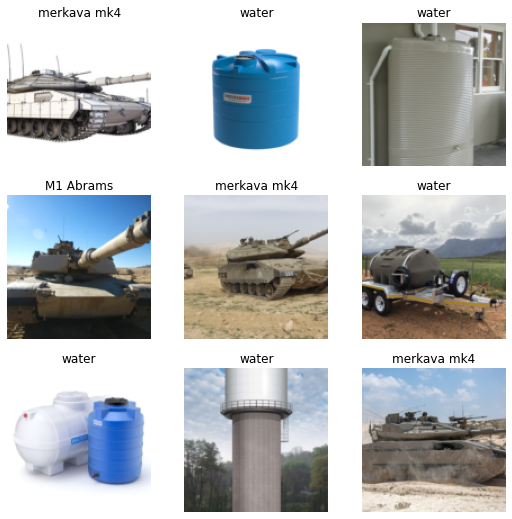

In [ ]:
dls.valid.show_batch()

## Preparing the data to the model

In [3]:
path = Path('/content/gdrive/MyDrive/tanks')

In [4]:
tanks = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())

In [ ]:
dls = tanks.dataloaders(path)

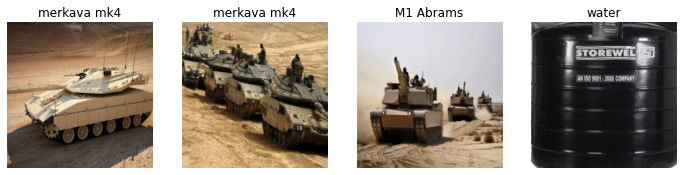

In [6]:
dls.valid.show_batch(max_n=4, nrows=1)

### Data Augmentation

## Training the model and clean the data

In [7]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.437875,0.810209,0.333333,00:54


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,0.536968,0.407019,0.142857,00:24
1,0.393917,0.193613,0.066667,00:25
2,0.297317,0.139224,0.057143,00:24
3,0.249617,0.127603,0.047619,00:24


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency e

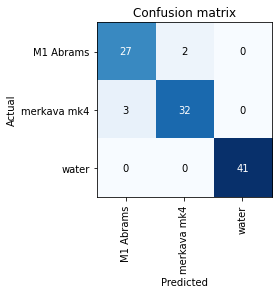

In [8]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [9]:
def plot_top_losses_fix(interp, k, largest=True, **kwargs):
        losses,idx = interp.top_losses(k, largest)
        if not isinstance(interp.inputs, tuple): interp.inputs = (interp.inputs,)
        if isinstance(interp.inputs[0], Tensor): inps = tuple(o[idx] for o in interp.inputs)
        else: inps = interp.dl.create_batch(interp.dl.before_batch([tuple(o[i] for o in interp.inputs) for i in idx]))
        b = inps + tuple(o[idx] for o in (interp.targs if is_listy(interp.targs) else (interp.targs,)))
        x,y,its = interp.dl._pre_show_batch(b, max_n=k)
        b_out = inps + tuple(o[idx] for o in (interp.decoded if is_listy(interp.decoded) else (interp.decoded,)))
        x1,y1,outs = interp.dl._pre_show_batch(b_out, max_n=k)
        if its is not None:
            #plot_top_losses(x, y, its, outs.itemgot(slice(len(inps), None)), L(self.preds).itemgot(idx), losses,  **kwargs)
            plot_top_losses(x, y, its, outs.itemgot(slice(len(inps), None)), interp.preds[idx], losses,  **kwargs)
        #TODO: figure out if this is needed
        #its None means that a batch knows how to show itself as a whole, so we pass x, x1
        #else: show_results(x, x1, its, ctxs=ctxs, max_n=max_n, **kwargs)

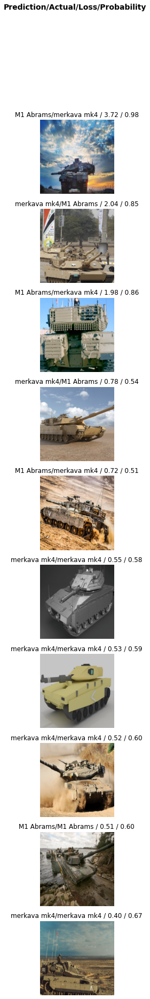

In [10]:
plot_top_losses_fix(interp, 10, nrows=10)

In [11]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [ ]:
# for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat/)

In [ ]:
for idx, cat in cleaner.change():
  f = cleaner.fns[idx]
  os.rename(f, f.parent/(f.parent.name+f.stem+f.suffix))
  shutil.move(str(f.parent/(f.parent.name+f.stem+f.suffix)), path/cat )

In [12]:
#hide
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
# for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

## POC with user interface

### Using the Model for Inference

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:
learn_inf = load_learner(path/'export.pkl')

In [ ]:
learn_inf.predict('/content/DSC01005.JPG') #return predicting category, index and probabilities based on vocab

('merkava mk4',
 TensorBase(1),
 TensorBase([3.5945e-02, 9.6391e-01, 1.4220e-04]))

In [ ]:
learn_inf.dls.vocab

['M1 Abrams', 'merkava mk4', 'water']

## Making multi label classifier on the same data


In [ ]:
lr = cnn_learner(dls, resnet18, loss_func=F.binary_cross_entropy_with_logits, metrics=partial(accuracy_multi, thresh=0.2) )

In [ ]:
lr.fine_tune(4)

In [ ]:
learnerm.export(fname='multi.pkl')

### Simple UI demo

In [ ]:
#To use our model in an application, we can simply treat the predict method as a regular function. 

In [ ]:
#loading the model (Arch+parameters)
path = Path()
learn_inf = load_learner(path/'multi.pkl')

In [ ]:
btn_upload = widgets.FileUpload()
out_pl = widgets.Output()
lbl_pred = widgets.Label()
btn_run = widgets.Button(description='Classify')

In [ ]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [ ]:
#hide_output
VBox([widgets.Label('Select your tank!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

TypeError: ignored

In [ ]:
print("hello world")

hello world


In [ ]:
learnerm.predict('/content/126.JPG')

((#1) ['water'],
 TensorBase([False, False, False,  True]),
 TensorBase([0.4033, 0.0402, 0.1413, 0.9869]))

In [1]:
a = torch.Tensor([1.7357, 0.0586, 0.9514])
sigmoid(a)

NameError: ignored

In [17]:
multi_learner.predict('/content/DUDU.jpg')

((#0) [],
 TensorBase([False, False, False]),
 TensorBase([0.0506, 0.3117, 0.1194]))

In [39]:
multi_learner.predict('/content/DUDU.jpg')

((#1) ['water'],
 TensorBase([False, False,  True]),
 TensorBase([0.0068, 0.4541, 0.7307]))

In [ ]:
multi_learner.predict('/content/manytanks.jpg')

In [19]:
multi_learner.predict('/content/merk_abrms2.jpeg')

((#2) ['M1 Abrams','merkava mk4'],
 TensorBase([ True,  True, False]),
 TensorBase([0.6895, 0.9527, 0.0021]))

In [20]:
multi_learner.predict('/content/merkav_abrams.jpg')

((#1) ['M1 Abrams'],
 TensorBase([ True, False, False]),
 TensorBase([0.9377, 0.4514, 0.0021]))

In [21]:
multi_learner.predict('/content/mek_abs_3.jpg')

((#1) ['M1 Abrams'],
 TensorBase([ True, False, False]),
 TensorBase([1.0000, 0.0072, 0.0388]))

In [22]:
multi_learner.predict('/content/TetroWtank.jpg')

((#1) ['water'],
 TensorBase([False, False,  True]),
 TensorBase([0.0694, 0.1050, 0.9140]))

In [6]:
a = torch.Tensor([0.0385, 0.2723, 0.9933])
sigmoid(a)

tensor([0.5096, 0.5677, 0.7297])

In [ ]:
a, b, c = lr.predict('/content/merk_abrms2.jpeg')
c.sigmoid()

TensorBase([0.2893, 0.9868, 0.0014])

In [ ]:
c.sigmoid()

TensorBase([0.0173, 0.3211, 0.8698])

In [4]:
a = torch.Tensor([0.2893, 0.9868, 0.0014])

In [5]:
sigmoid(a)

tensor([0.5718, 0.7285, 0.5003])

# Try Multi label model on the sdata

In [17]:
def parentlabel(x):
  return [x.parent.name]
tanks = DataBlock(
    blocks=(ImageBlock, MultiCategoryBlock), 
    #MultiCategoryBlock(add_na=True)
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parentlabel,
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())

In [18]:
dls = tanks.dataloaders(path)

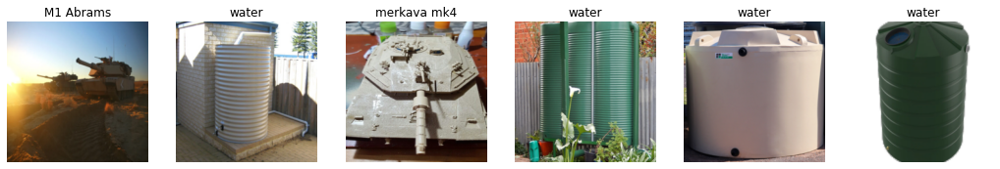

In [19]:
dls.valid.show_batch(nrows=1, ncols=6)

In [20]:
multi_learner = cnn_learner(dls, resnet18, metrics=accuracy_multi) #threshold=0.5, Sigmod=True--->partial(accuracy_multi, thresh=0.95

In [21]:
multi_learner.fine_tune(4)

epoch,train_loss,valid_loss,accuracy_multi,time
0,0.893661,0.472797,0.807692,00:24


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,accuracy_multi,time
0,0.449631,0.304821,0.865385,00:25
1,0.374115,0.210239,0.923077,00:24
2,0.301523,0.188452,0.935897,00:25
3,0.250654,0.172491,0.942308,00:25


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency e

Fixing the top lose

In [11]:
def plot_top_losses_fix(interp, k, largest=True, **kwargs):
        losses,idx = interp.top_losses(k, largest)
        if not isinstance(interp.inputs, tuple): interp.inputs = (interp.inputs,)
        if isinstance(interp.inputs[0], Tensor): inps = tuple(o[idx] for o in interp.inputs)
        else: inps = interp.dl.create_batch(interp.dl.before_batch([tuple(o[i] for o in interp.inputs) for i in idx]))
        b = inps + tuple(o[idx] for o in (interp.targs if is_listy(interp.targs) else (interp.targs,)))
        x,y,its = interp.dl._pre_show_batch(b, max_n=k)
        b_out = inps + tuple(o[idx] for o in (interp.decoded if is_listy(interp.decoded) else (interp.decoded,)))
        x1,y1,outs = interp.dl._pre_show_batch(b_out, max_n=k)
        if its is not None:
            #plot_top_losses(x, y, its, outs.itemgot(slice(len(inps), None)), L(self.preds).itemgot(idx), losses,  **kwargs)
            plot_top_losses(x, y, its, outs.itemgot(slice(len(inps), None)), interp.preds[idx], losses,  **kwargs)
        #TODO: figure out if this is needed
        #its None means that a batch knows how to show itself as a whole, so we pass x, x1
        #else: show_results(x, x1, its, ctxs=ctxs, max_n=max_n, **kwargs)

In [22]:
multi_learner.dls.vocab

['M1 Abrams', 'merkava mk4', 'water']

In [23]:
intrpt = ClassificationInterpretation.from_learner(multi_learner)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


,target,predicted,probabilities,loss
0,merkava mk4,M1 Abrams,"TensorBase([9.9983e-01, 3.1218e-03, 7.8878e-04])",4.815834999084473
1,merkava mk4,M1 Abrams,"TensorBase([0.8605, 0.0919, 0.0084])",1.4551619291305542
2,merkava mk4,M1 Abrams,"TensorBase([0.8435, 0.1732, 0.0020])",1.2034705877304077
3,M1 Abrams,M1 Abrams;merkava mk4,"TensorBase([0.8885, 0.9355, 0.0217])",0.960605800151825
4,merkava mk4,M1 Abrams;merkava mk4,"TensorBase([0.9272, 0.7732, 0.0028])",0.9600050449371338
5,merkava mk4,merkava mk4;water,"TensorBase([0.0306, 0.7528, 0.9226])",0.9578433036804199
6,M1 Abrams,M1 Abrams;merkava mk4,"TensorBase([9.7386e-01, 9.0976e-01, 5.6531e-04])",0.8107695579528809
7,M1 Abrams,M1 Abrams;merkava mk4,"TensorBase([0.6724, 0.7653, 0.0034])",0.6165328025817871
8,water,merkava mk4;water,"TensorBase([0.0045, 0.7726, 0.9973])",0.4960571229457855
9,merkava mk4,M1 Abrams;merkava mk4,"TensorBase([0.7109, 0.8735, 0.0010])",0.45905405282974243


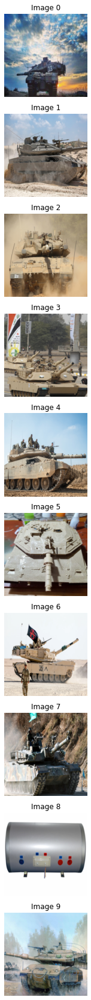

In [24]:
plot_top_losses_fix(intrpt, 10, nrows=10)

In [27]:
multi_learner.metrics = partial(accuracy_multi, thresh=0.2)

In [28]:
multi_learner.validate()

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


(#2) [0.17249105870723724,0.9070513248443604]

In [ ]:
preds, targs = multi_learner.get_preds()

In [34]:
preds.shape, targs.shape

(torch.Size([104, 3]), torch.Size([104, 3]))

In [36]:
preds[0], targs[0]

(TensorBase([0.9940, 0.0058, 0.0028]), TensorMultiCategory([1., 0., 0.]))

In [37]:
accuracy_multi(preds, targs, thresh=0.5, sigmoid=False)

TensorBase(0.9423)

In [38]:
th = [0.1, 0.3, 0.5, 0.7, 0.9]

In [39]:
[accuracy_multi(preds, targs, thresh=x, sigmoid=False) for x in th]

[TensorBase(0.8750),
 TensorBase(0.9167),
 TensorBase(0.9423),
 TensorBase(0.9487),
 TensorBase(0.9487)]

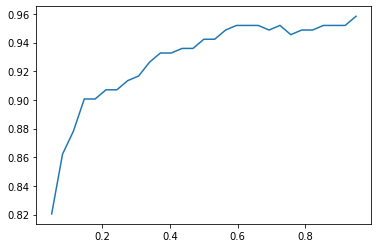

In [40]:
xs = torch.linspace(0.05,0.95,29)
accs = [accuracy_multi(preds, targs, thresh=i, sigmoid=False) for i in xs]
plt.plot(xs,accs);